# Notable Observations: What makes them notable?

 According to the eBird API documentation, notable observations can be for locally or nationally rare species or are otherwise unusual, e.g. over-wintering birds in a species which is normally only a summer visitor.

# Issues to work:

1. DAVID - Notable birds in region - try Texas or Austin (Houston!!) -- pick a few wildlife refuges / on the coast / national seashore / etc

#### Citation: eBird Basic Dataset. Version: EBD_relAug-2020. Cornell Lab of Ornithology, Ithaca, New York. Aug 2020.

In [6]:
# import dependencies
import os, csv, requests, json, datetime
import pandas as pd
import plotly.express as px
from config import api_key, mapbox_token, g_key
from datetime import date

%reload_ext lab_black

px.set_mapbox_access_token(mapbox_token)

<img src="./Resources/Calliope_Range_Map.png" alt="RANGE MAP: Calliope Hummingbird, https://doi.org/10.2173/bow.calhum.01" style="border: 1px solid darkgray" align="left" width="400px">

<span style="color:white">
<h1 align="center">Notable Observations in Texas</h3>
<h3 align="center">Calliope Hummingbird, Selasphorus calliope</h3>
    
Some range maps for the Calliope Hummingbird extend the Fall Migration zone further east in Texas, but the majority limit the range to west Texas or even far west Texas.  The fall migration south is underway as the Calliope make their way to their wintering grounds in the pine oak forests of Mexico.
    

#### Interesting facts (from WhatBird.com):
    
Although it is the smallest bird in the United States, the Calliope Hummingbird travels more than 5,000 miles from the mountains of the northwest to Mexico and back.
    
It prefers high mountains, and has been seen as high as 11,000 feet.
    
The Calliope Hummingbird is the smallest breeding bird in North America and the smallest long-distance avian migrant in the world.
    
A group of hummingbirds has many collective nouns, including a “bouquet", "glittering", "hover", "shimmer", and "tune” of hummingbirds.
    
###### <blockquote>Image citation: Calder, W. A. and L. L. Calder (2020). Calliope Hummingbird (Selasphorus calliope), version 1.0. In Birds of the World (A. F. Poole and F. B. Gill, Editors). Cornell Lab of Ornithology, Ithaca, NY, USA. https://doi.org/10.2173/bow.calhum.01</blockquote>

In [18]:
## Import sound dependencies
from IPython.display import Audio, display


def allDone():
    display(
        Audio(
            url="https://www.allaboutbirds.org/guide/assets/sound/calliope_call.mp3",
            autoplay=True,
        )
    )


## Insert whatever audio file you want above
# allDone()

In [89]:
# Obtain list of Texas cities and codes

regionType = "subnational2"
parentRegionCode = "US-TX"
state = "Texas"

url = (
    "https://api.ebird.org/v2/ref/region/list/"
    + regionType
    + "/"
    + parentRegionCode
    + ".json"
)

r = requests.get(url, params={"key": api_key})

In [4]:
r.url

'https://api.ebird.org/v2/ref/region/list/subnational2/US-TX.json?key=d56mdhi9b35r'

In [5]:
df_city_codes = pd.DataFrame(r.json())
df_city_codes.loc[df_city_codes["name"] == "Austin"]

,code,name
7,US-TX-015,Austin


In [6]:
cities = df_city_codes[
    "code"
].to_list()  # save cities to a list to be able to iterate over later

# START - TEXAS

In [76]:
today = date.today()
back_short = 3
back_long = 30

In [77]:
# ALL notable observations in Texas
regionCode = "US-TX"

url_notables = (
    "https://api.ebird.org/v2/data/obs/"
    + regionCode
    + "/recent/notable?back=30"  # max number of days back for observations = 30
)

r_notables = requests.get(
    url_notables, params={"key": api_key, "back": back_long, "detail": "full"}
)

In [78]:
r_notables.status_code

200

In [79]:
r_notables.url

'https://api.ebird.org/v2/data/obs/US-TX/recent/notable?back=30&key=d56mdhi9b35r&back=30&detail=full'

### Notable Observations Dataframe

In [80]:
df_notables = pd.DataFrame(r_notables.json())

In [81]:
pd.to_datetime(df_notables["obsDt"])
df_notables["Year"] = pd.DatetimeIndex(df_notables["obsDt"]).year
df_notables["Month"] = pd.DatetimeIndex(df_notables["obsDt"]).month
df_notables["Day"] = pd.DatetimeIndex(df_notables["obsDt"]).day

In [82]:
df_notables.columns  # Pulled in the detailed dataset to pick which columns I wanted to keep and rename.

Index(['speciesCode', 'comName', 'sciName', 'locId', 'locName', 'obsDt',
       'howMany', 'lat', 'lng', 'obsValid', 'obsReviewed', 'locationPrivate',
       'subId', 'subnational2Code', 'subnational2Name', 'subnational1Code',
       'subnational1Name', 'countryCode', 'countryName', 'userDisplayName',
       'obsId', 'checklistId', 'presenceNoted', 'hasComments', 'firstName',
       'lastName', 'hasRichMedia', 'evidence', 'Year', 'Month', 'Day'],
      dtype='object')

In [83]:
df_notables.drop(
    columns=[
        "locId",
        "locName",
        "obsValid",
        "obsReviewed",
        "locationPrivate",
        "userDisplayName",
        "presenceNoted",
        "hasComments",
        "evidence",
        "firstName",
        "lastName",
        "hasRichMedia",
    ]
)

,speciesCode,comName,sciName,obsDt,howMany,lat,lng,subId,subnational2Code,subnational2Name,subnational1Code,subnational1Name,countryCode,countryName,obsId,checklistId,Year,Month,Day
0,belvir,Bell's Vireo,Vireo bellii,2020-09-30 23:34,1.0,30.609820,-96.282113,S74266845,US-TX-041,Brazos,US-TX,Texas,US,United States,OBS989146134,CL22990,2020,9,30
1,brnthr,Brown Thrasher,Toxostoma rufum,2020-09-30 19:57,1.0,30.621147,-103.982382,S74265850,US-TX-243,Jeff Davis,US-TX,Texas,US,United States,OBS989134631,CL23634,2020,9,30
2,brnthr,Brown Thrasher,Toxostoma rufum,2020-09-30 19:57,1.0,30.621147,-103.982382,S74265850,US-TX-243,Jeff Davis,US-TX,Texas,US,United States,OBS989134631,CL23634,2020,9,30
3,brnthr,Brown Thrasher,Toxostoma rufum,2020-09-30 19:57,1.0,30.621147,-103.982382,S74265850,US-TX-243,Jeff Davis,US-TX,Texas,US,United States,OBS989134631,CL23634,2020,9,30
4,brnboo,Brown Booby,Sula leucogaster,2020-09-30 18:45,14.0,29.879946,-93.909931,S74261584,US-TX-245,Jefferson,US-TX,Texas,US,United States,OBS989086200,CL22322,2020,9,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3903,pomjae,Pomarine Jaeger,Stercorarius pomarinus,2020-09-01 07:16,1.0,30.700161,-97.359747,S73071023,US-TX-491,Williamson,US-TX,Texas,US,United States,OBS975170119,CL23348,2020,9,1
3904,pomjae,Pomarine Jaeger,Stercorarius pomarinus,2020-09-01 07:16,1.0,30.700161,-97.359747,S73071023,US-TX-491,Williamson,US-TX,Texas,US,United States,OBS975170119,CL23348,2020,9,1
3905,pipplo,Piping Plover,Charadrius melodus,2020-09-01 06:58,1.0,33.070398,-96.991596,S73064923,US-TX-121,Denton,US-TX,Texas,US,United States,OBS975090825,CL24759,2020,9,1
3906,pipplo,Piping Plover,Charadrius melodus,2020-09-01 06:58,1.0,33.070398,-96.991596,S73064924,US-TX-121,Denton,US-TX,Texas,US,United States,OBS975090875,CL24759,2020,9,1


In [84]:
columns_dict = {
    "speciesCode": "Species_Code",
    "comName": "Common_Name",
    "sciName": "Scientific_Name",
    "obsDt": "Date",
    "howMany": "Bird_Count",
    "subnational2Name": "City_Name",
    "subnational1Code": "State_Code",
    "subnational1Name": "State_Name",
    "countryCode": "Country_Code",
    "countryName": "Country_Name",
}

df_notables = df_notables.rename(columns=columns_dict)

In [85]:
df_notables["Bird_Count"].fillna(value=1, inplace=True)

In [86]:
df_notables.to_csv("Resources/NotableObs_eBird.csv", index=False)

observation_data = os.path.join("Resources", "NotableObs_eBird.csv")

In [99]:
df_notables["Notable_Normal"] = 2
df_notables.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'locId', 'locName',
       'Date', 'Bird_Count', 'lat', 'lng', 'obsValid', 'obsReviewed',
       'locationPrivate', 'subId', 'subnational2Code', 'City_Name',
       'State_Code', 'State_Name', 'Country_Code', 'Country_Name',
       'userDisplayName', 'obsId', 'checklistId', 'presenceNoted',
       'hasComments', 'firstName', 'lastName', 'hasRichMedia', 'evidence',
       'Year', 'Month', 'Day', 'Notable_Normal'],
      dtype='object')

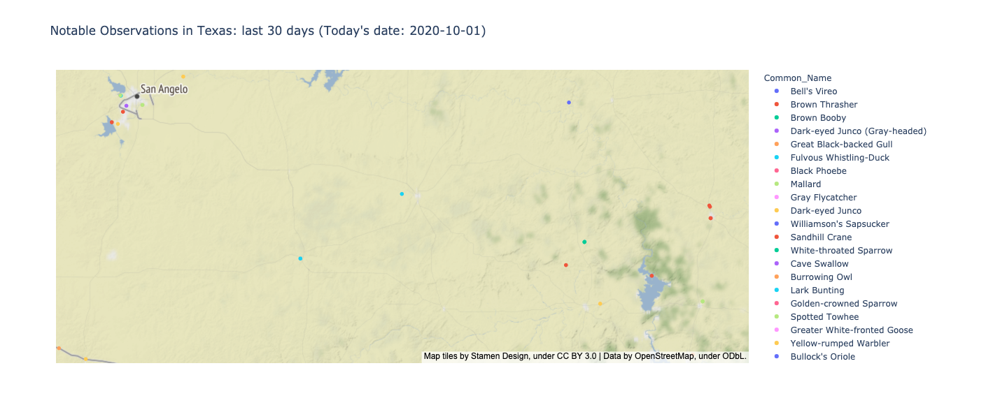

In [104]:
# mapbox_style options:
#     'open-street-map'`,
#     `'white-bg'`, `'carto-positron'`, `'carto-darkmatter'`, `'stamen-
#     terrain'`, `'stamen-toner'`, `'stamen-watercolor'`. Allowed values
#     which do require a Mapbox API token are `'basic'`, `'streets'`,
#     `'outdoors'`, `'light'`, `'dark'`, `'satellite'`, `'satellite-
#     streets'`

fig_df_notables = px.scatter_mapbox(
    df_notables,
    lat="lat",
    lon="lng",
    color="Common_Name",
    #     size="Bird_Count",
    hover_name="Common_Name",
    hover_data=["Bird_Count", "Date"],
    title=f"All Notable Observations in {state}: last {back_long} days (Today's date: {today})",
    mapbox_style="stamen-terrain",
    width=1000,
    height=600,
)
fig_df_notables.show()

### Citation: eBird Basic Dataset. Version: EBD_relAug-2020. Cornell Lab of Ornithology, Ithaca, New York. Aug 2020.

In [15]:
df_notables.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'locId', 'locName',
       'obsDt', 'Bird_Count', 'lat', 'lng', 'obsValid', 'obsReviewed',
       'locationPrivate', 'subId', 'subnational2Code', 'City_Name',
       'State_Code', 'State_Name', 'Country_Code', 'Country_Name',
       'userDisplayName', 'obsId', 'checklistId', 'presenceNoted',
       'hasComments', 'evidence', 'firstName', 'lastName', 'hasRichMedia',
       'Year', 'Month', 'Day'],
      dtype='object')

In [16]:
name_count = df_notables["Common_Name"].value_counts()
name_count.to_frame()

,Common_Name
Calliope Hummingbird,154
Red-necked Phalarope,108
Sabine's Gull,107
Rufous Hummingbird,92
Anna's Hummingbird,81
...,...
Eastern Wood-Pewee,1
Fox Sparrow,1
Downy Woodpecker (Eastern),1
White-crowned Sparrow (oriantha),1


In [31]:
calliope_df = df_notables.loc[df_notables["Common_Name"] == "Calliope Hummingbird"]
calliope_df.head(1)

,Species_Code,Common_Name,Scientific_Name,locId,locName,obsDt,Bird_Count,lat,lng,obsValid,...,checklistId,presenceNoted,hasComments,evidence,firstName,lastName,hasRichMedia,Year,Month,Day
497,calhum,Calliope Hummingbird,Selasphorus calliope,L839995,Riverpark Nature Trails (Sugar Land),2020-09-26 16:15,1.0,29.57722,-95.677732,True,...,CL22324,False,False,NaN,Jean,Greenhalgh,False,2020,9,26


In [43]:
species = "Calliope Hummingbird"

In [114]:
species_plot.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'locId', 'locName',
       'Date', 'Bird_Count', 'lat', 'lng', 'obsValid', 'obsReviewed',
       'locationPrivate', 'subId', 'subnational2Code', 'City_Name',
       'State_Code', 'State_Name', 'Country_Code', 'Country_Name',
       'userDisplayName', 'obsId', 'checklistId', 'presenceNoted',
       'hasComments', 'firstName', 'lastName', 'hasRichMedia', 'evidence',
       'Year', 'Month', 'Day', 'Notable_Normal'],
      dtype='object')

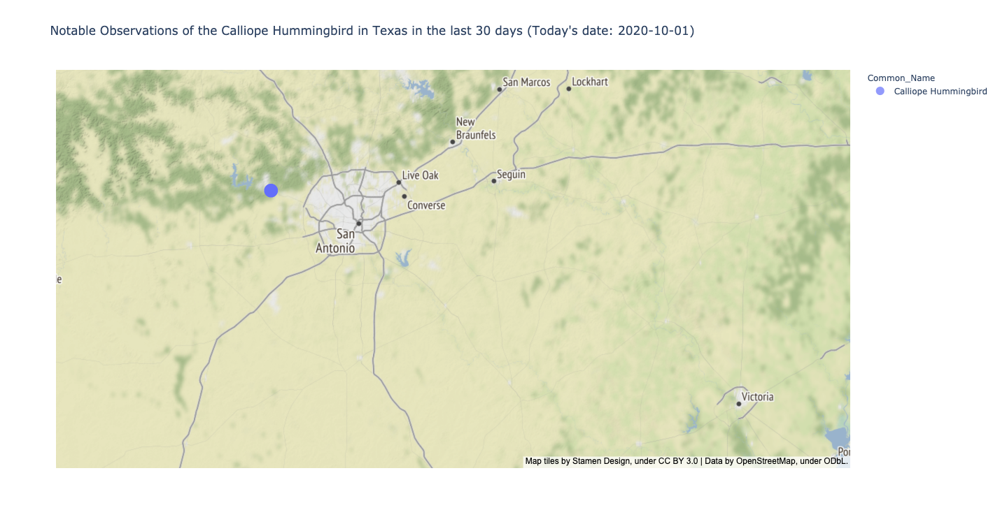

In [115]:
# Maps with plotly

species_plot = df_notables.loc[df_notables["Common_Name"] == f"{species}"]

fig_species_plot = px.scatter_mapbox(
    species_plot,
    lat="lat",
    lon="lng",
    color="Common_Name",
    size="Bird_Count",
    hover_name="Common_Name",
    hover_data=["Bird_Count", "Date"],
    title=f"Notable Observations of the {species} in {state} in the last {back_long} days (Today's date: {today})",
    mapbox_style="stamen-terrain",
    width=1100,
    height=750,
)
fig_species_plot.show()

### TAXONOMY of Calliope

In [51]:
species_code = "calhum"

In [32]:
# Get the taxonomy for the most common observed species
url_species_taxonomy = "https://api.ebird.org/v2/ref/taxonomy/ebird"

r_species_taxonomy = requests.get(
    url_species_taxonomy,
    params={"key": api_key, "fmt": "json", "species": species_code},
)

In [33]:
r_species_taxonomy.json()

[{'sciName': 'Selasphorus calliope',
  'comName': 'Calliope Hummingbird',
  'speciesCode': 'calhum',
  'category': 'species',
  'taxonOrder': 4691.0,
  'bandingCodes': ['CAHU'],
  'comNameCodes': [],
  'sciNameCodes': ['SECA'],
  'order': 'Caprimulgiformes',
  'familyComName': 'Hummingbirds',
  'familySciName': 'Trochilidae'}]

In [36]:
df_species_taxonomy = pd.DataFrame(r_species_taxonomy.json())
df_species_taxonomy

,sciName,comName,speciesCode,category,taxonOrder,bandingCodes,comNameCodes,sciNameCodes,order,familyComName,familySciName
0,Selasphorus calliope,Calliope Hummingbird,calhum,species,4691.0,[CAHU],[],[SECA],Caprimulgiformes,Hummingbirds,Trochilidae


In [41]:
df_species_taxonomy = df_species_taxonomy.rename(
    columns={
        "order": "Order",
        "familySciName": "Family_Name",
        "comName": "Common_Name",
        "sciName": "Scientific_Name",
    }
)

In [42]:
df_species_taxonomy

,Scientific_Name,Common_Name,speciesCode,category,taxonOrder,bandingCodes,comNameCodes,sciNameCodes,Order,familyComName,Family_Name
0,Selasphorus calliope,Calliope Hummingbird,calhum,species,4691.0,[CAHU],[],[SECA],Caprimulgiformes,Hummingbirds,Trochilidae


In [38]:
calliope_df.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'locId', 'locName',
       'obsDt', 'Bird_Count', 'lat', 'lng', 'obsValid', 'obsReviewed',
       'locationPrivate', 'subId', 'subnational2Code', 'City_Name',
       'State_Code', 'State_Name', 'Country_Code', 'Country_Name',
       'userDisplayName', 'obsId', 'checklistId', 'presenceNoted',
       'hasComments', 'evidence', 'firstName', 'lastName', 'hasRichMedia',
       'Year', 'Month', 'Day'],
      dtype='object')

# START - US

### Calliope across the US - normal observations

In [52]:
# Get data for all specified species observations across the US

regionCodeUS = "US"

# https://api.ebird.org/v2/data/obs/{{regionCode}}/recent/{{speciesCode}}

url_species_US = (
    f"https://api.ebird.org/v2/data/obs/" + regionCodeUS + "/recent/" + species_code
)

r_species_US = requests.get(url_species_US, params={"key": api_key, "back": back_long})

In [54]:
r_species_US.status_code

200

In [64]:
df_species_US = pd.DataFrame(r_species_US.json())

In [94]:
df_species_US["howMany"].fillna(value=1, inplace=True)

In [97]:
df_species_US["Notable_Normal"] = 1
df_species_US

,speciesCode,comName,sciName,locId,locName,obsDt,howMany,lat,lng,obsValid,obsReviewed,locationPrivate,subId,Notable_Normal
0,calhum,Calliope Hummingbird,Selasphorus calliope,L268114,Madera Canyon--Santa Rita Lodge,2020-09-30 06:26,1.0,31.725151,-110.880107,True,False,False,S74246757,1
1,calhum,Calliope Hummingbird,Selasphorus calliope,L129060,Portal,2020-09-29 15:27,1.0,31.913601,-109.140800,True,False,False,S74221578,1
2,calhum,Calliope Hummingbird,Selasphorus calliope,L263942,Christmas Mountains Oasis,2020-09-29 13:41,1.0,29.491777,-103.467039,True,False,False,S74228818,1
3,calhum,Calliope Hummingbird,Selasphorus calliope,L247122,Paton Center for Hummingbirds (Patons' Yard),2020-09-29 10:37,1.0,31.539013,-110.760634,True,False,False,S74215516,1
4,calhum,Calliope Hummingbird,Selasphorus calliope,L264842,Miller Canyon--Beatty's Guest Ranch,2020-09-29 08:10,2.0,31.415602,-110.276528,True,False,False,S74232217,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
506,calhum,Calliope Hummingbird,Selasphorus calliope,L3914786,"Bosque River Loop Trail, Ojo Caliente",2020-09-01 08:00,1.0,36.304900,-106.050415,True,False,False,S73088442,1
507,calhum,Calliope Hummingbird,Selasphorus calliope,L6337663,Pleasant Valley & Lake Canal greenbelt at W La...,2020-09-01 07:40,1.0,40.568837,-105.127859,True,False,False,S73064907,1
508,calhum,Calliope Hummingbird,Selasphorus calliope,L3758077,US-CO-Grand Junction-520 Riverview Dr,2020-09-01 07:33,1.0,39.080072,-108.614438,True,False,True,S73064928,1
509,calhum,Calliope Hummingbird,Selasphorus calliope,L12197543,"4100 Arizona Ave, Los Alamos US-NM 35.90445, -...",2020-09-01 07:02,2.0,35.904451,-106.325099,True,False,True,S73063629,1


In [105]:
pd.to_datetime(df_species_US["obsDt"])
df_species_US["Year"] = pd.DatetimeIndex(df_species_US["obsDt"]).year
df_species_US["Month"] = pd.DatetimeIndex(df_species_US["obsDt"]).month
df_species_US["Day"] = pd.DatetimeIndex(df_species_US["obsDt"]).day
df_species_US

,speciesCode,comName,sciName,locId,locName,obsDt,howMany,lat,lng,obsValid,obsReviewed,locationPrivate,subId,Notable_Normal,Year,Month,Day
0,calhum,Calliope Hummingbird,Selasphorus calliope,L268114,Madera Canyon--Santa Rita Lodge,2020-09-30 06:26,1.0,31.725151,-110.880107,True,False,False,S74246757,1,2020,9,30
1,calhum,Calliope Hummingbird,Selasphorus calliope,L129060,Portal,2020-09-29 15:27,1.0,31.913601,-109.140800,True,False,False,S74221578,1,2020,9,29
2,calhum,Calliope Hummingbird,Selasphorus calliope,L263942,Christmas Mountains Oasis,2020-09-29 13:41,1.0,29.491777,-103.467039,True,False,False,S74228818,1,2020,9,29
3,calhum,Calliope Hummingbird,Selasphorus calliope,L247122,Paton Center for Hummingbirds (Patons' Yard),2020-09-29 10:37,1.0,31.539013,-110.760634,True,False,False,S74215516,1,2020,9,29
4,calhum,Calliope Hummingbird,Selasphorus calliope,L264842,Miller Canyon--Beatty's Guest Ranch,2020-09-29 08:10,2.0,31.415602,-110.276528,True,False,False,S74232217,1,2020,9,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
506,calhum,Calliope Hummingbird,Selasphorus calliope,L3914786,"Bosque River Loop Trail, Ojo Caliente",2020-09-01 08:00,1.0,36.304900,-106.050415,True,False,False,S73088442,1,2020,9,1
507,calhum,Calliope Hummingbird,Selasphorus calliope,L6337663,Pleasant Valley & Lake Canal greenbelt at W La...,2020-09-01 07:40,1.0,40.568837,-105.127859,True,False,False,S73064907,1,2020,9,1
508,calhum,Calliope Hummingbird,Selasphorus calliope,L3758077,US-CO-Grand Junction-520 Riverview Dr,2020-09-01 07:33,1.0,39.080072,-108.614438,True,False,True,S73064928,1,2020,9,1
509,calhum,Calliope Hummingbird,Selasphorus calliope,L12197543,"4100 Arizona Ave, Los Alamos US-NM 35.90445, -...",2020-09-01 07:02,2.0,35.904451,-106.325099,True,False,True,S73063629,1,2020,9,1


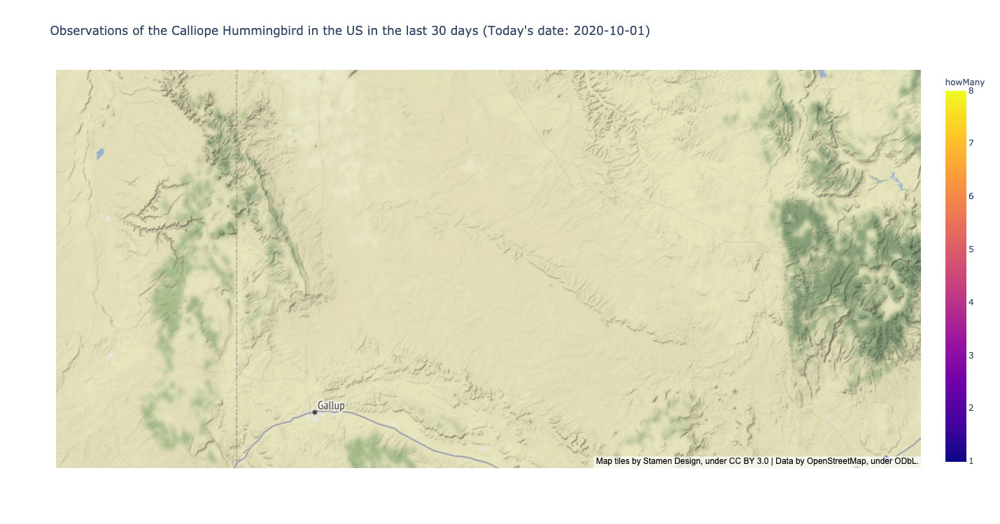

In [96]:
# species_plot = df_species_US.loc[df_species_US["comName"] == f"{species}"]

# Covering US for full 30 days and especially for a single species won't work because you're limited to 10k records. Could be missing a large portion of data.

fig_df_species_US = px.scatter_mapbox(
    df_species_US,
    lat="lat",
    lon="lng",
    color="howMany",
    size="howMany",
    hover_name="comName",
    hover_data=["sciName", "howMany", "obsDt"],
    title=f"Observations of the {species} in the US in the last {back_long} days (Today's date: {today})",
    mapbox_style="stamen-terrain",
    width=1000,
    height=750,
)
fig_df_species_US.show()

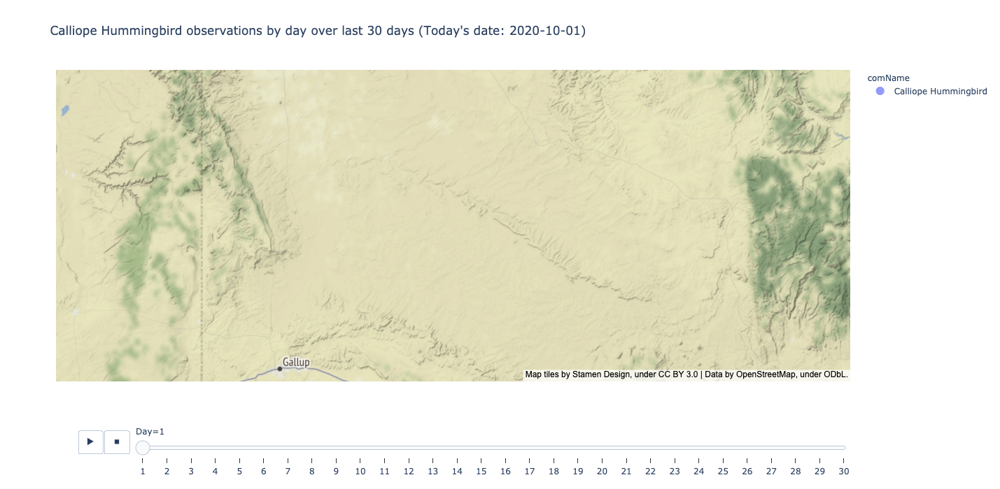

In [121]:
# Animation of species observations over last 30 days

# mapbox_style options:
#     'open-street-map'`,
#     `'white-bg'`, `'carto-positron'`, `'carto-darkmatter'`, `'stamen-
#     terrain'`, `'stamen-toner'`, `'stamen-watercolor'`. Allowed values
#     which do require a Mapbox API token are `'basic'`, `'streets'`,
#     `'outdoors'`, `'light'`, `'dark'`, `'satellite'`, `'satellite-
#     streets'`

animate_species_df = df_species_US.sort_values(by=["Day"], ignore_index=True)

fig_animate_species = px.scatter_mapbox(
    animate_species_df,
    color="comName",
    lat="lat",
    lon="lng",
    hover_name="sciName",
    size="howMany",
    animation_frame="Day",
    mapbox_style="stamen-terrain",
    width=1100,
    height=700,
    title=f"{species} observations by day over last {back_long} days (Today's date: {today})",
)

fig_animate_species.show()

### All notable observations across the US

In [ ]:
# Get data for all notable observations across the US

regionCodeUS = "US"



url_notables_US = (
    f"https://api.ebird.org/v2/data/obs/" + regionCodeUS + "/recent/notable?"
)

r_notables_US = requests.get(
    url_notables_US, params={"key": api_key, "back": back_short, "detail": "full"}
)

In [39]:
df_notables_US = pd.DataFrame(r_notables_US.json())
df_notables_US.columns

Index(['speciesCode', 'comName', 'sciName', 'locId', 'locName', 'obsDt',
       'howMany', 'lat', 'lng', 'obsValid', 'obsReviewed', 'locationPrivate',
       'subId', 'subnational2Code', 'subnational2Name', 'subnational1Code',
       'subnational1Name', 'countryCode', 'countryName', 'userDisplayName',
       'obsId', 'checklistId', 'presenceNoted', 'hasComments', 'evidence',
       'firstName', 'lastName', 'hasRichMedia'],
      dtype='object')

In [40]:
df_notables_US["howMany"].fillna(value=1, inplace=True)

In [41]:
df_notables_US

,speciesCode,comName,sciName,locId,locName,obsDt,howMany,lat,lng,obsValid,...,countryName,userDisplayName,obsId,checklistId,presenceNoted,hasComments,evidence,firstName,lastName,hasRichMedia
0,brnthr,Brown Thrasher,Toxostoma rufum,L4790127,Olds Creek Bird Sanctuary,2020-09-30 19:57,1.0,30.621147,-103.982382,False,...,United States,Cecilia Riley,OBS989134631,CL23634,False,False,P,Cecilia,Riley,True
1,brnthr,Brown Thrasher,Toxostoma rufum,L4790127,Olds Creek Bird Sanctuary,2020-09-30 19:57,1.0,30.621147,-103.982382,False,...,United States,Cecilia Riley,OBS989134631,CL23634,False,False,P,Cecilia,Riley,True
2,brnthr,Brown Thrasher,Toxostoma rufum,L4790127,Olds Creek Bird Sanctuary,2020-09-30 19:57,1.0,30.621147,-103.982382,False,...,United States,Cecilia Riley,OBS989134631,CL23634,False,False,P,Cecilia,Riley,True
3,amewoo,American Woodcock,Scolopax minor,L6235318,Robinson/Vanderah House,2020-09-30 19:43,1.0,29.482305,-82.263942,False,...,United States,Scott Robinson,OBS989076633,CL24521,False,False,NaN,Scott,Robinson,False
4,ycnher,Yellow-crowned Night-Heron,Nyctanassa violacea,L6235318,Robinson/Vanderah House,2020-09-30 19:43,1.0,29.482305,-82.263942,False,...,United States,Scott Robinson,OBS989076626,CL24521,False,False,NaN,Scott,Robinson,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8234,rosspo1,Roseate Spoonbill,Platalea ajaja,L710850,Glendale Recharge Ponds,2020-09-28 05:46,3.0,33.524224,-112.286582,True,...,United States,Jeff Ritz,OBS988067975,CL22360,False,False,P,Jeff,Ritz,True
8235,rosspo1,Roseate Spoonbill,Platalea ajaja,L710850,Glendale Recharge Ponds,2020-09-28 05:46,3.0,33.524224,-112.286582,True,...,United States,Jeff Ritz,OBS988067975,CL22360,False,False,P,Jeff,Ritz,True
8236,earque,Eared Quetzal,Euptilotis neoxenus,L12323203,"stakeout Eared Quetzal, FR42 between Sunny Fla...",2020-09-28 05:45,2.0,31.881505,-109.189116,True,...,United States,Rose Ann Rowlett,OBS988319691,CL22345,False,False,NaN,Rose,Ann Rowlett,False
8237,whsowl1,Whiskered Screech-Owl,Megascops trichopsis,L128985,Cave Creek Canyon--Herb Martyr CG,2020-09-28 04:46,2.0,31.872499,-109.233597,True,...,United States,Eric Hough,OBS988170505,CL22345,False,False,NaN,Eric,Hough,False


### CALLLIOPE

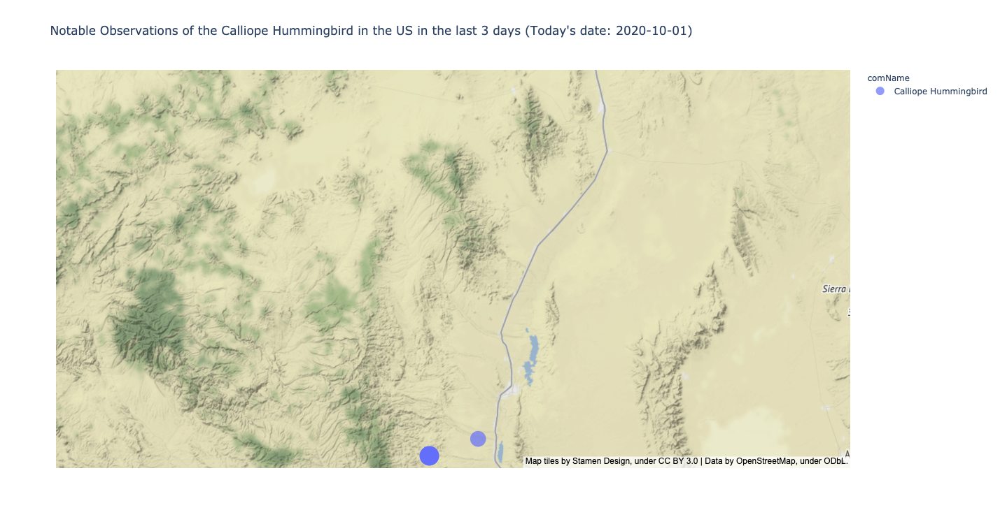

In [48]:
species_plot = df_notables_US.loc[df_notables_US["comName"] == f"{species}"]

# Covering US for full 30 days and especially for a single species won't work because you're limited to 10k records. Could be missing a large portion of data.

fig_df_notables_US = px.scatter_mapbox(
    species_plot,
    lat="lat",
    lon="lng",
    color="comName",
    size="howMany",
    hover_name="comName",
    hover_data=["howMany", "obsDt"],
    title=f"Notable Observations of the {species} in the US in the last {back_short} days (Today's date: {today})",
    mapbox_style="stamen-terrain",
    width=1000,
    height=750,
)
fig_df_notables_US.show()

## Histogram of observations count by US State

In [24]:
state_code = df_notables_US["subnational1Code"]

state_codes = pd.DataFrame({"State_Code": state_code})

NameError: name 'df_notables_US' is not defined

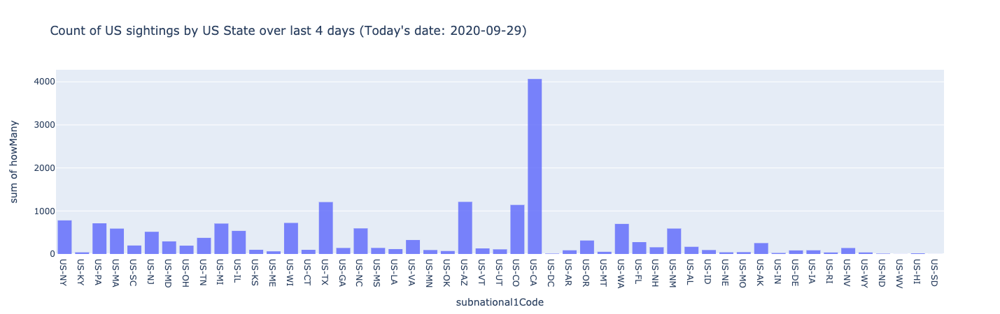

In [80]:
# loc_state = df_notables_US["subnational1Code"].unique()
# obs_count = df_notables_US["subnational1Code"].value_counts()

px.histogram(
    df_notables_US,
    x="subnational1Code",
    y="howMany",
    title=f"Count of US sightings by US State over last {back} days (Today's date: {today})",
    labels={"y": "Obs Count"},
    opacity=0.85,
    hover_name="subnational1Code",
)

# Animated Map

In [81]:
# df_notables_US = df_notables_US.dropna().reset_index(drop=True)

In [82]:
pd.to_datetime(df_notables_US["obsDt"])
df_notables_US["Year"] = pd.DatetimeIndex(df_notables_US["obsDt"]).year
df_notables_US["Month"] = pd.DatetimeIndex(df_notables_US["obsDt"]).month
df_notables_US["Day"] = pd.DatetimeIndex(df_notables_US["obsDt"]).day

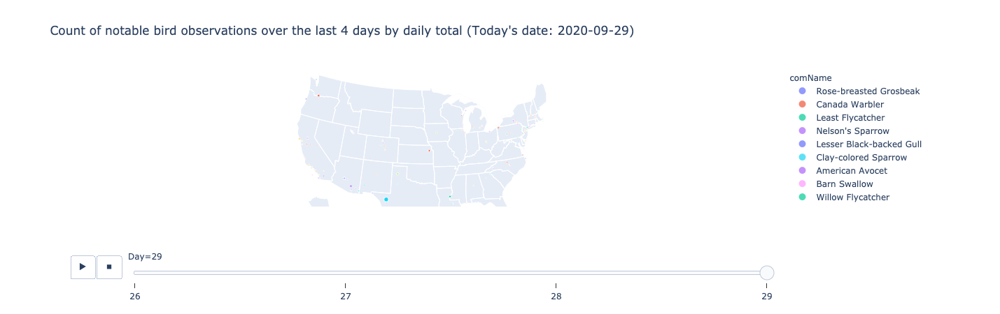

In [83]:
# Animate observations over time (4 days. Going back more than 4 days exceeds the allowable limit on number of records to request at a time for the API).
# Was going to iteratively add counts by days but maybe don't want to show the accumulation? May just want to show the total by day?
# Have two maps: one with accumulated observations over the 4 days, one with counts per day.
# With this map, you can identify an observation of interest, then research the bird type to find out why the observation is "notable".

animate_plot_df = df_notables_US.sort_values(by=["Day"], ignore_index=True)

fig_animate = px.scatter_geo(
    animate_plot_df,
    color="comName",
    lat="lat",
    lon="lng",
    hover_name="sciName",
    size="howMany",
    animation_frame="Day",
    projection="albers usa",
    title=f"Count of notable bird observations over the last {back} days by daily total (Today's date: {today})",
)

fig_animate.show()

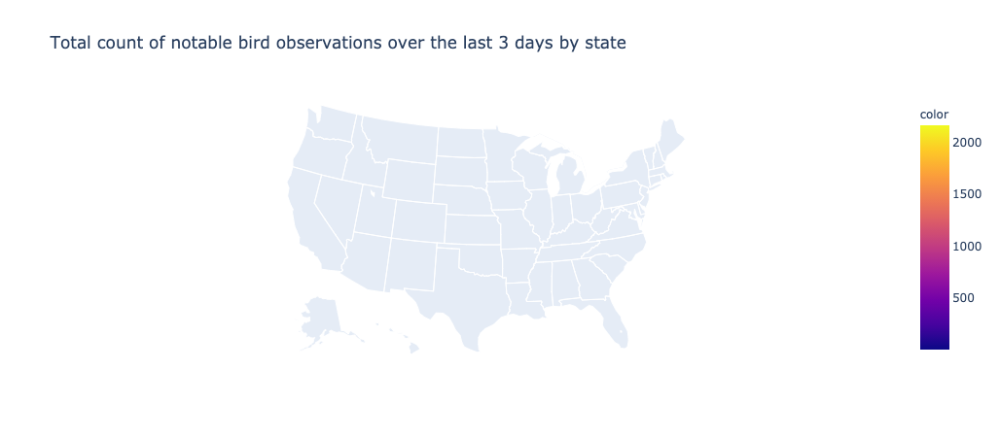

In [127]:
fig_bubble = px.scatter_geo(
    df_notables_US,
    color=obs_count,
    locations=loc_state,
    hover_name=obs_count,
    size=obs_count,
    projection="albers usa",
    title=f"Total count of notable bird observations over the last {back} days by state (Today's date: {today})",
)
fig_bubble.show()

## Notes:
### Data cleaning: 
#### * Renamed columns --Drop some unneeded columns?
#### * From obsDt column, created new columns Year, Month, Day, and US_State.
#### * Filtered out rows with NA data. Was it only one row with NA for "howMany"? If so, maybe do .fillna() with a value of "1" since the observation wouldn't have been recorded if there were 0 birds. Also, most observations are of 1 bird, right?

### Multiple Data Sources:
#### * eBird
#### * Google API - used reverse geocoding to get state from lat/long. --still working on this (9/28/20)--

# TEST AREA

In [36]:
# latlong = "40.714224,-73.961452"
# url_googleapi = (
#     f"https://maps.googleapis.com/maps/api/geocode/json?latlng={lat_lng_str}&key={g_key}"
# )

# r_states = requests.get(url_googleapi)

# states = r_states.json()
# states["results"][0]["address_components"][5]["short_name"]

# state = states["results"][0]["address_components"][5]["short_name"]
# state

In [25]:
# url_googleapi = (f"https://maps.googleapis.com/maps/api/geocode/json?latlng={lat_lng_str}&key={g_key}")

state_abbr = [
    "AL",
    "AK",
    "AZ",
    "AR",
    "CA",
    "CO",
    "CT",
    "DC",
    "DE",
    "FL",
    "GA",
    "HI",
    "ID",
    "IL",
    "IN",
    "IA",
    "KS",
    "KY",
    "LA",
    "ME",
    "MD",
    "MA",
    "MI",
    "MN",
    "MS",
    "MO",
    "MT",
    "NE",
    "NV",
    "NH",
    "NJ",
    "NM",
    "NY",
    "NC",
    "ND",
    "OH",
    "OK",
    "OR",
    "PA",
    "RI",
    "SC",
    "SD",
    "TN",
    "TX",
    "UT",
    "VT",
    "VA",
    "WA",
    "WV",
    "WI",
    "WY",
]

for i in df_notables.index:

    lat = df_notables.loc[i, "lat"]
    lng = df_notables.loc[i, "lng"]

    lat_lng_str = str(lat) + "," + str(lng)

    try:
        r_states = requests.get(
            f"https://maps.googleapis.com/maps/api/geocode/json?latlng={lat_lng_str}&key={g_key}"
        )

        states = r_states.json()
        state = states["results"][0]["address_components"][4]["short_name"]

        df_notables.loc[i, "US_State"] = state
    except:
        pass

In [135]:
states["results"][0]["address_components"][4]["short_name"]

'TX'

In [136]:
states["results"][0]["address_components"]

[{'long_name': '1104', 'short_name': '1104', 'types': ['street_number']},
 {'long_name': 'Scarlet Court',
  'short_name': 'Scarlet Ct',
  'types': ['route']},
 {'long_name': 'Colleyville',
  'short_name': 'Colleyville',
  'types': ['locality', 'political']},
 {'long_name': 'Tarrant County',
  'short_name': 'Tarrant County',
  'types': ['administrative_area_level_2', 'political']},
 {'long_name': 'Texas',
  'short_name': 'TX',
  'types': ['administrative_area_level_1', 'political']},
 {'long_name': 'United States',
  'short_name': 'US',
  'types': ['country', 'political']},
 {'long_name': '76034', 'short_name': '76034', 'types': ['postal_code']},
 {'long_name': '4107', 'short_name': '4107', 'types': ['postal_code_suffix']}]

In [137]:
df_notables.loc[df_notables["US_State"] == "Bell County"]

,speciesCode,comName,sciName,locId,locName,obsDt,howMany,lat,lng,obsValid,obsReviewed,locationPrivate,subId,US_State
96,coukin,Couch's Kingbird,Tyrannus couchii,L4904145,Belton--Harris Community Park,2020-09-26 15:55,1.0,31.060991,-97.465424,True,True,False,S74098380,Bell County


In [138]:
r_check = requests.get(
    f"https://maps.googleapis.com/maps/api/geocode/json?latlng=31.060991,-97.465424&key={g_key}"
)
check = r_check.json()

In [139]:
check["results"][0]["address_components"][4]

{'long_name': 'Bell County',
 'short_name': 'Bell County',
 'types': ['administrative_area_level_2', 'political']}

In [142]:
# getting a list of sub-region codes (subnational1 for US is a list of states, subnational2 for US-TX is a list of cities)
regionType = "subnational1"
parentRegionCode = "US-TX"

url_state_codes = (
    "https://api.ebird.org/v2/ref/region/list/"
    + regionType
    + "/"
    + parentRegionCode
    + ".json"
)

r_state_codes = requests.get(url_state_codes, params={"key": api_key})

df_state_codes = pd.DataFrame(r.json())
df_state_codes

,code,name
0,US-TX-001,Anderson
1,US-TX-003,Andrews
2,US-TX-005,Angelina
3,US-TX-007,Aransas
4,US-TX-009,Archer
...,...,...
249,US-TX-499,Wood
250,US-TX-501,Yoakum
251,US-TX-503,Young
252,US-TX-505,Zapata


In [43]:
# for i in df_notables_US.index:

#     lat = df_notables_US.loc[i, "lat"]
#     lng = df_notables_US.loc[i, "lng"]

#     lat_lng_str = str(lat) + "," + str(lng)

#     try:
#         r = requests.get(
#             "https://maps.googleapis.com/maps/api/place/nearbysearch/json",
#             params={
#                 "location": lat_lng_str,
#                 "radius": 5000,
#                 "type": "lodging",
#                 "key": g_key,
#             },
#         )
#         hotel_df.loc[i, "Hotel_Name"] = r.json()["results"][0]["name"]
#     except:
#         pass